In [1]:
import os
import cv2
import ntpath
import random
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.utils import shuffle
from keras.models import Sequential
from imgaug import augmenters as iaa
from sklearn.model_selection import train_test_split
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard, CSVLogger

In [2]:
datadir = r'./data/mode1'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 1000)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\center_2024_04_14_10_01_35_006.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\left_2024_04_14_10_01_35_006.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\right_2024_04_14_10_01_35_006.jpg,0.0,0.000000,0,0.000078
1,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\center_2024_04_14_10_01_35_107.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\left_2024_04_14_10_01_35_107.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\right_2024_04_14_10_01_35_107.jpg,0.0,0.000000,0,0.000080
2,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\center_2024_04_14_10_01_35_210.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\left_2024_04_14_10_01_35_210.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\right_2024_04_14_10_01_35_210.jpg,0.0,0.000000,0,0.000078
3,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\center_2024_04_14_10_01_35_311.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\left_2024_04_14_10_01_35_311.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\right_2024_04_14_10_01_35_311.jpg,0.0,0.000000,0,0.000078
4,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\center_2024_04_14_10_01_35_416.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\left_2024_04_14_10_01_35_416.jpg,C:\Users\NAVDEEP\Desktop\Projects\Self car driving\Self-Driving-Car\IMG\right_2024_04_14_10_01_35_416.jpg,0.0,0.285925,0,0.213245


In [3]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.tail()

,center,left,right,steering,throttle,reverse,speed
5106,center_2024_04_14_10_10_40_793.jpg,left_2024_04_14_10_10_40_793.jpg,right_2024_04_14_10_10_40_793.jpg,0.0,0.0,0,23.27239
5107,center_2024_04_14_10_10_40_897.jpg,left_2024_04_14_10_10_40_897.jpg,right_2024_04_14_10_10_40_897.jpg,0.0,0.0,0,23.03873
5108,center_2024_04_14_10_10_41_005.jpg,left_2024_04_14_10_10_41_005.jpg,right_2024_04_14_10_10_41_005.jpg,0.0,0.0,0,22.76144
5109,center_2024_04_14_10_10_41_112.jpg,left_2024_04_14_10_10_41_112.jpg,right_2024_04_14_10_10_41_112.jpg,0.0,0.0,0,22.53256
5110,center_2024_04_14_10_10_41_224.jpg,left_2024_04_14_10_10_41_224.jpg,right_2024_04_14_10_10_41_224.jpg,0.0,0.0,0,22.26047


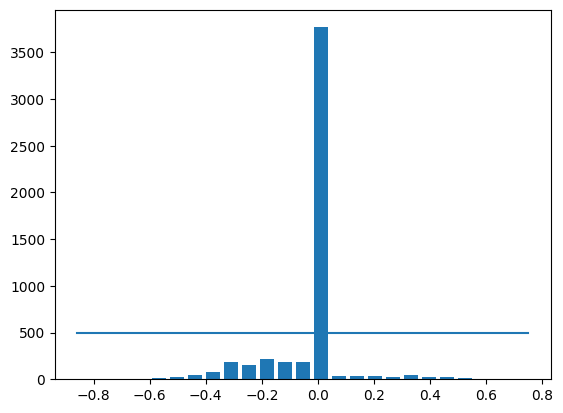

In [4]:
num_bins = 25
samples_per_bin = 500
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [5]:
print('total data:', len(data))
print(data.shape)

total data: 5111
(5111, 7)


In [6]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 3268
remaining: 1843


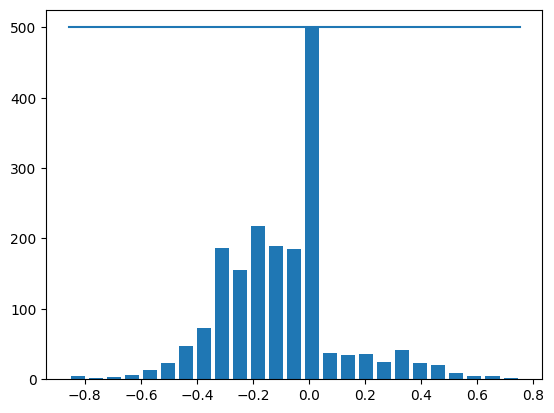

In [7]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [8]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
    
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
      
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [9]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

C:\Users\NAVDEEP\AppData\Local\Temp\ipykernel_8144\4062067901.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\NAVDEEP\AppData\Local\Temp\ipykernel_8144\4062067901.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\NAVDEEP\AppData\Local\Temp\ipykernel_8144\4062067901.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

In [10]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 4423
Valid Samples: 1106


Text(0.5, 1.0, 'Validation set')

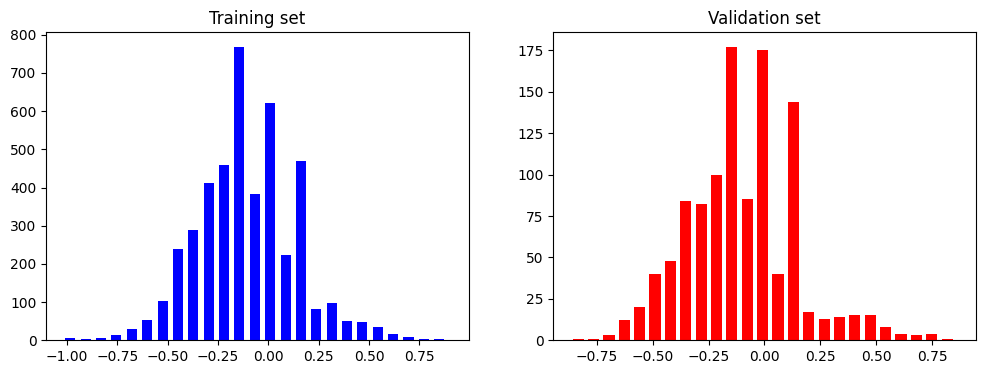

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

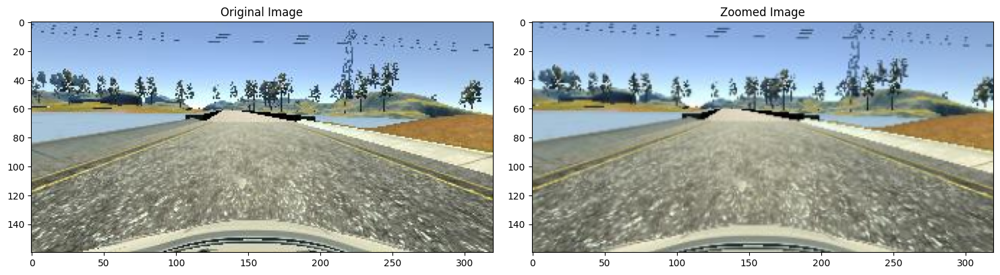

In [12]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

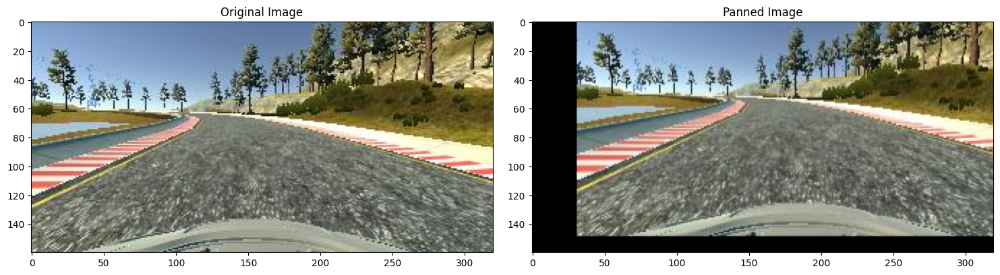

In [13]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

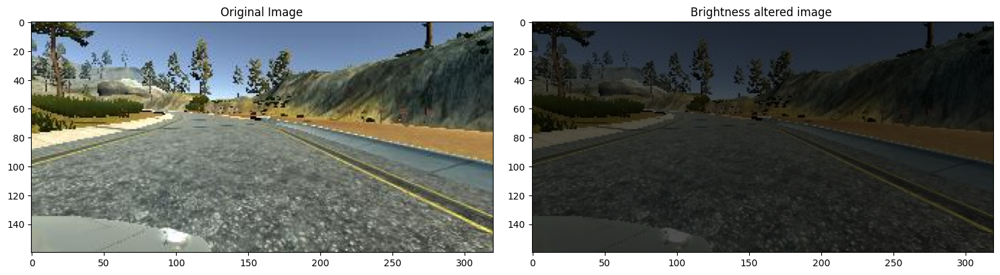

In [14]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ') 

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.15')

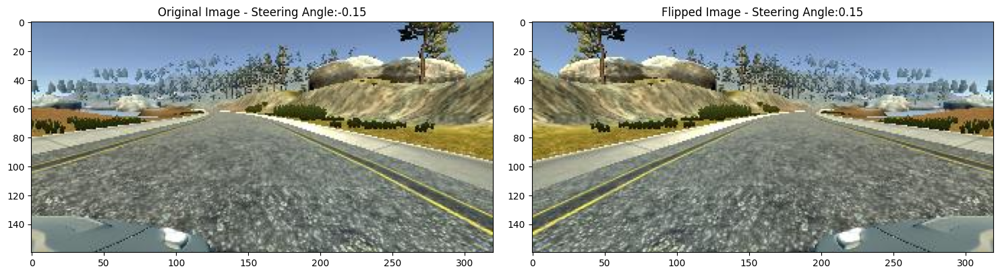

In [15]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [16]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

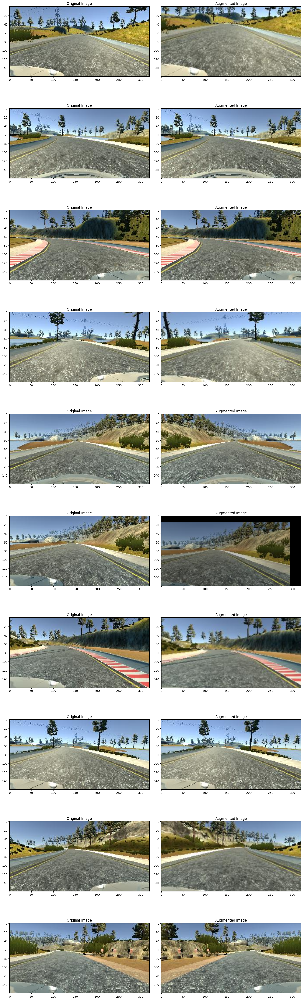

In [17]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

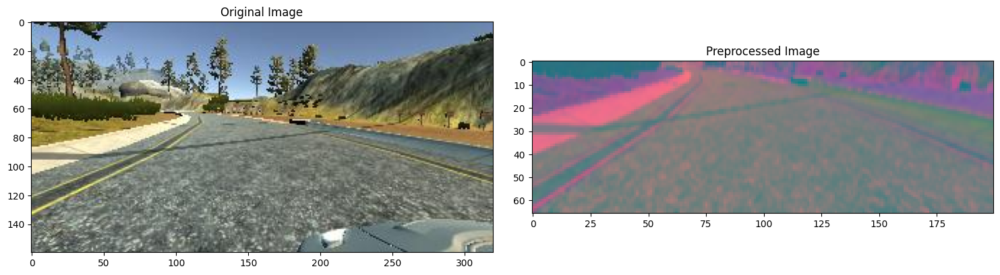

In [18]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [19]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [20]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

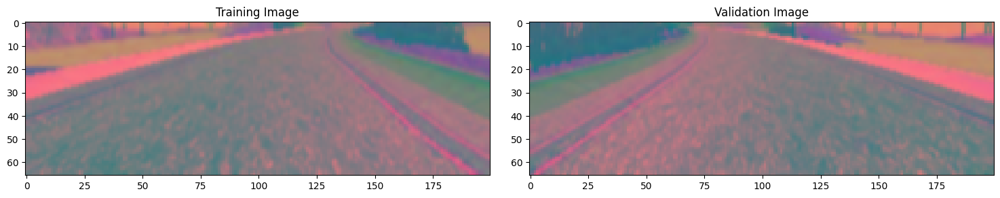

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [32]:
def customModel():
    model = Sequential()
    model.add(Conv2D(36, (5, 5), strides=(2, 2), padding="same", input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), padding="same", activation='elu'))
    model.add(Conv2D(60, (3, 3), strides=(2, 2), padding="same", activation='elu'))
    model.add(Conv2D(72, (3, 3), strides=(2, 2), padding="same", activation='elu'))
    model.add(Conv2D(84, (3, 3), strides=(2, 2), padding="same", activation='elu'))
    model.add(Dropout(0.5))


    model.add(Flatten())

    model.add(Dense(100, activation = 'elu'))
    model.add(Dropout(0.5))
    model.add(Dense(50, activation = 'elu'))
    model.add(Dropout(0.2))
    model.add(Dense(10, activation = 'elu'))

    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

model = customModel()
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 33, 100, 36)       2736      
                                                                 
 conv2d_9 (Conv2D)           (None, 17, 50, 48)        43248     
                                                                 
 conv2d_10 (Conv2D)          (None, 9, 25, 60)         25980     
                                                                 
 conv2d_11 (Conv2D)          (None, 5, 13, 72)         38952     
                                                                 
 conv2d_12 (Conv2D)          (None, 3, 7, 84)          54516     
                                                                 
 dropout_5 (Dropout)         (None, 3, 7, 84)          0         
                                                                 
 flatten_2 (Flatten)         (None, 1764)             

In [33]:
cnn_path = 'model/custom_model'
name = 'custom_model.h5'
chk_path = os.path.join(cnn_path, name)

checkpoint = ModelCheckpoint(filepath=chk_path,
                             save_best_only=True,
                             verbose=1,
                             mode='auto',
                             monitor='val_loss')

earlystop = EarlyStopping(monitor='val_loss',
                          min_delta=0,
                          patience=5,
                          verbose=1,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=6,
                              verbose=1,
                              min_delta=0.0001)

csv_logger = CSVLogger(os.path.join(cnn_path,'training.log'))

callbacks = [checkpoint, earlystop, reduce_lr, csv_logger]

In [34]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=30,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1,
                                  callbacks = callbacks
                             )

C:\Users\NAVDEEP\AppData\Local\Temp\ipykernel_8144\1362267916.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/30
300/300 [==============================] - ETA: 0s - loss: 0.0864
Epoch 1: val_loss improved from inf to 0.03900, saving model to model/custom_model\custom_model.h5
300/300 [==============================] - 126s 418ms/step - loss: 0.0864 - val_loss: 0.0390 - lr: 0.0010
Epoch 2/30
300/300 [==============================] - ETA: 0s - loss: 0.0503
Epoch 2: val_loss did not improve from 0.03900
300/300 [==============================] - 126s 422ms/step - loss: 0.0503 - val_loss: 0.0401 - lr: 0.0010
Epoch 3/30
300/300 [==============================] - ETA: 0s - loss: 0.0470
Epoch 3: val_loss improved from 0.03900 to 0.03222, saving model to model/custom_model\custom_model.h5
300/300 [==============================] - 128s 429ms/step - loss: 0.0470 - val_loss: 0.0322 - lr: 0.0010
Epoch 4/30
300/300 [==============================] - ETA: 0s - loss: 0.0452
Epoch 4: val_loss did not improve from 0.03222
300/300 [==============================] - 127s 424ms/step - loss: 0.0452 - va

Text(0.5, 0, 'Epoch')

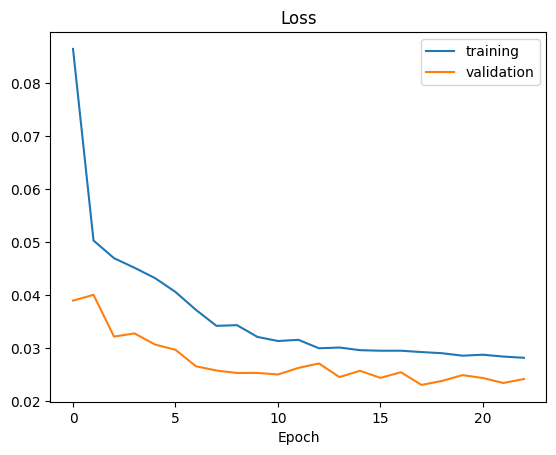

In [35]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [26]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(10, activati on = 'elu'))
  model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_6 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_7 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 dropout_1 (Dropout)         (None, 1, 18, 64)         0         
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)              

In [27]:
cnn_path = 'model/nvidia_model'
name = 'nvidia_model.h5'
chk_path = os.path.join(cnn_path, name)

checkpoint = ModelCheckpoint(filepath=chk_path,
                             save_best_only=True,
                             verbose=1,
                             mode='auto',
                             monitor='val_loss')

earlystop = EarlyStopping(monitor='val_loss',
                          min_delta=0,
                          patience=5,
                          verbose=1,
                          restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=6,
                              verbose=1,
                              min_delta=0.0001)

csv_logger = CSVLogger(os.path.join(cnn_path,'training.log'))

callbacks = [checkpoint, earlystop, reduce_lr, csv_logger]

In [28]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=30,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1,
                                  callbacks = callbacks
                             )

C:\Users\NAVDEEP\AppData\Local\Temp\ipykernel_8144\1362267916.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/30
300/300 [==============================] - ETA: 0s - loss: 0.0832
Epoch 1: val_loss improved from inf to 0.04263, saving model to model/nvidia_model\nvidia_model.h5
300/300 [==============================] - 125s 413ms/step - loss: 0.0832 - val_loss: 0.0426 - lr: 0.0010
Epoch 2/30
300/300 [==============================] - ETA: 0s - loss: 0.0583
Epoch 2: val_loss improved from 0.04263 to 0.03591, saving model to model/nvidia_model\nvidia_model.h5
300/300 [==============================] - 123s 413ms/step - loss: 0.0583 - val_loss: 0.0359 - lr: 0.0010
Epoch 3/30
300/300 [==============================] - ETA: 0s - loss: 0.0532
Epoch 3: val_loss improved from 0.03591 to 0.03502, saving model to model/nvidia_model\nvidia_model.h5
300/300 [==============================] - 125s 417ms/step - loss: 0.0532 - val_loss: 0.0350 - lr: 0.0010
Epoch 4/30
300/300 [==============================] - ETA: 0s - loss: 0.0517
Epoch 4: val_loss did not improve from 0.03502
300/300 [=============

Text(0.5, 0, 'Epoch')

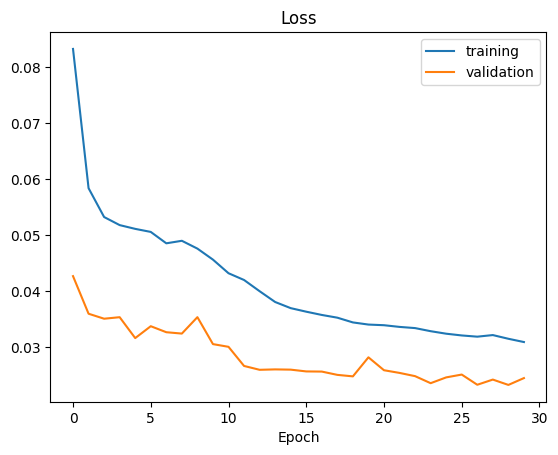

In [29]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')